In [1]:
import matplotlib.pyplot as plt
import seaborn as sn
import numpy as np
import pandas as pd
import skimage.filters as flt
import skimage.io as io
import matplotlib as mpl
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from matplotlib.colors import ListedColormap
from lecturesupport import plotsupport as ps
import pandas as pd
from sklearn.datasets import make_blobs
import scipy.stats as stats
import astropy.io.fits as fits
%matplotlib inline


from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg', 'png')
#plt.style.use('seaborn')
mpl.rcParams['figure.dpi'] = 300

In [2]:
import importlib
importlib.reload(ps);

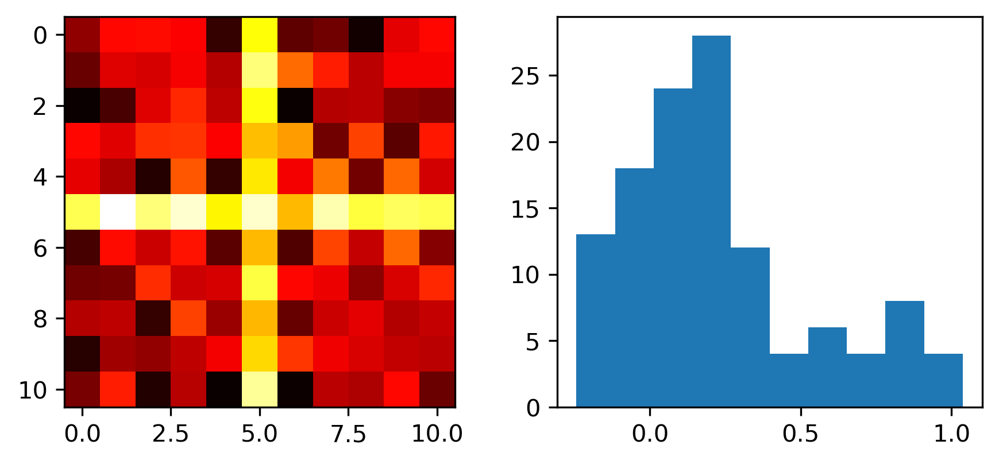

In [3]:
fig,ax = plt.subplots(1,2,figsize=(7,3))
nx = 5; ny = 5;
xx, yy = np.meshgrid(np.arange(-nx, nx+1)/nx*2*np.pi, 
                     np.arange(-ny, ny+1)/ny*2*np.pi)
cross_im =   1.5*np.abs(np.cos(xx*yy))/(np.abs(xx*yy)+(3*np.pi/nx)) + np.random.uniform(-0.25, 0.25, size = xx.shape)
im=ax[0].imshow(cross_im, cmap = 'hot'); 
ax[1].hist(cross_im.ravel(),bins=10);

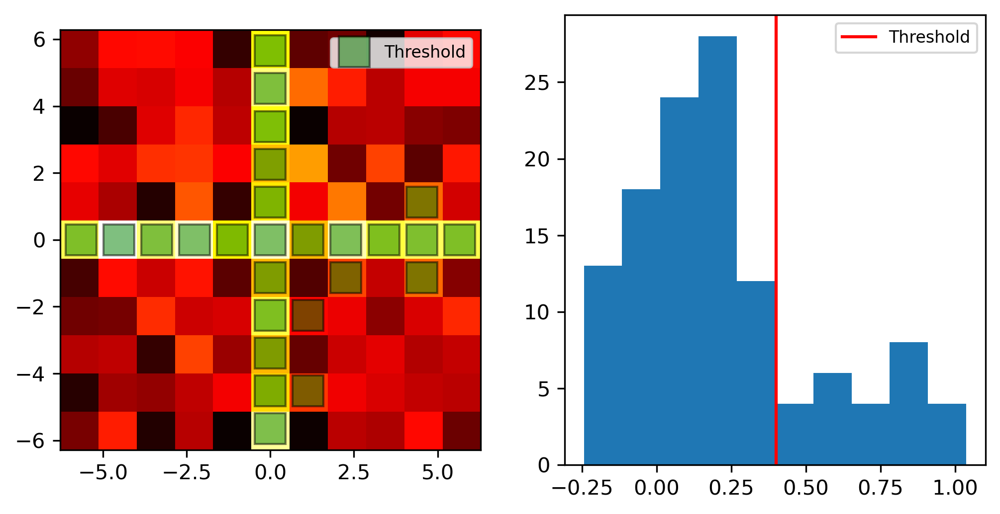

In [4]:
threshold = 0.4; thresh_img = cross_im > threshold

fig,ax = plt.subplots(1,2,figsize=(8,4))
ax[0].imshow(cross_im, cmap = 'hot', extent = [xx.min(), xx.max(), yy.min(), yy.max()])
ax[0].plot(xx[np.where(thresh_img)]*0.9, yy[np.where(thresh_img)]*0.9,
           'ks', markerfacecolor = 'green', alpha = 0.5,label = 'Threshold', markersize = 15); ax[0].legend(fontsize=8);
ax[1].hist(cross_im.ravel(),bins=10); ax[1].axvline(x=threshold,color='r',label='Threshold'); ax[1].legend(fontsize=8);

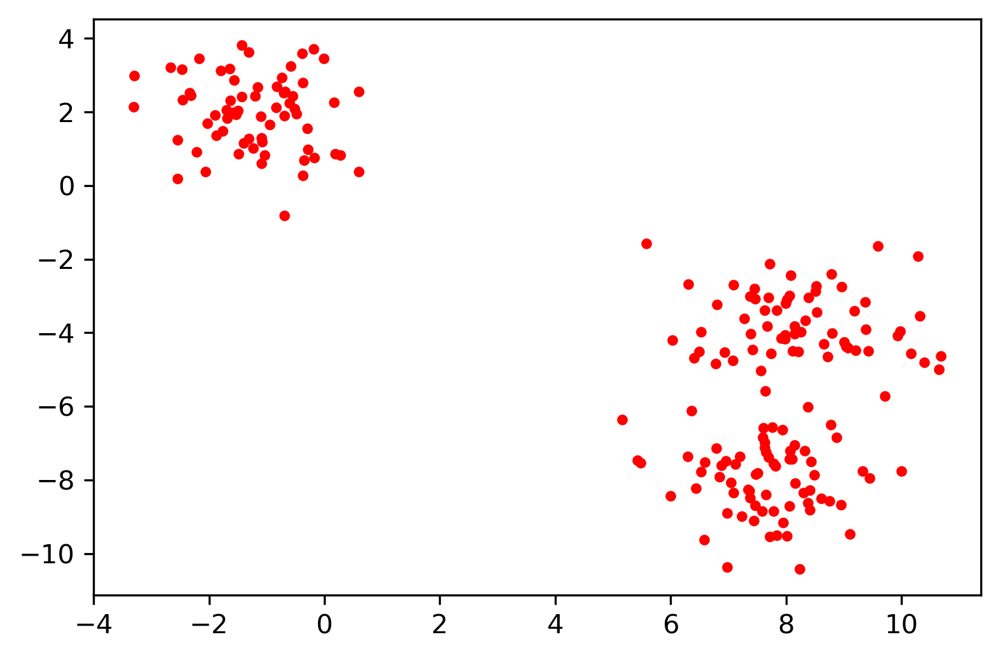

In [5]:
test_pts = pd.DataFrame(make_blobs(n_samples=200, random_state=2018)[
                        0], columns=['x', 'y'])
plt.plot(test_pts.x, test_pts.y, 'r.');

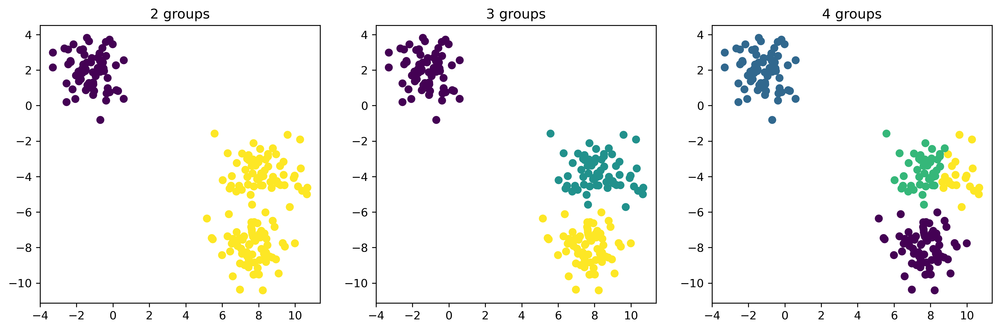

In [6]:
fig, ax = plt.subplots(1,3,figsize=(15,4.5))

for i in range(3) :
    km = KMeans(n_clusters=i+2, random_state=2018); n_grp = km.fit_predict(test_pts)
    ax[i].scatter(test_pts.x, test_pts.y, c=n_grp)
    ax[i].set_title('{0} groups'.format(i+2))

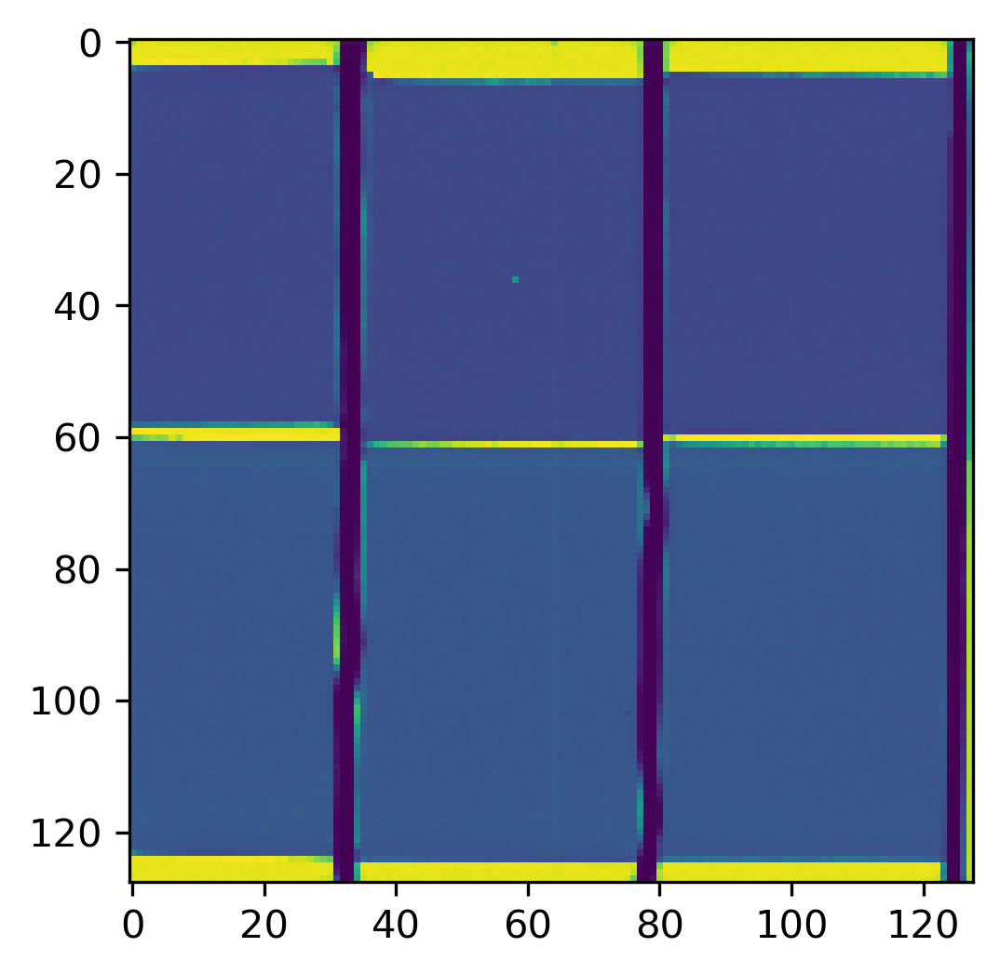

In [7]:
tof  = np.load('../data/tofdata.npy')
wtof = tof.mean(axis=2)
plt.imshow(wtof);

In [8]:
tofr=tof.reshape([tof.shape[0]*tof.shape[1],tof.shape[2]])
print("Input ToF dimensions",tof.shape)
print("Reshaped ToF data",tofr.shape)

Input ToF dimensions (128, 128, 661)
Reshaped ToF data (16384, 661)


In [9]:
km = KMeans(n_clusters=4, random_state=2018)
c  = km.fit_predict(tofr).reshape(tof.shape[:2]) # Label image
kc = km.cluster_centers_.transpose()             # cluster centroid spectra

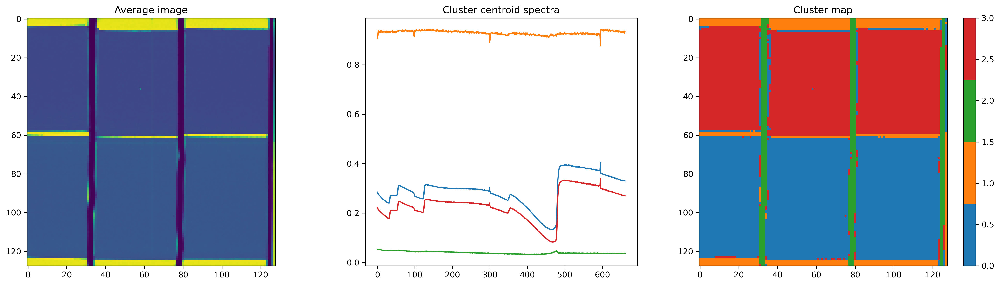

In [10]:
fig,axes = plt.subplots(1,3,figsize=(18,5)); axes=axes.ravel()
axes[0].imshow(wtof,cmap='viridis'); axes[0].set_title('Average image')
p=axes[1].plot(kc);                  axes[1].set_title('Cluster centroid spectra'); axes[1].set_aspect(tof.shape[2], adjustable='box')
cmap=ps.buildCMap(p) # Create a color map with the same colors as the plot

im=axes[2].imshow(c,cmap=cmap); plt.colorbar(im);
axes[2].set_title('Cluster map');
plt.tight_layout()

In [11]:
km = KMeans(n_clusters=10, random_state=2018)
c  = km.fit_predict(tofr).reshape(tof.shape[:2]) # Label image
kc = km.cluster_centers_.transpose()             # cluster centroid spectra

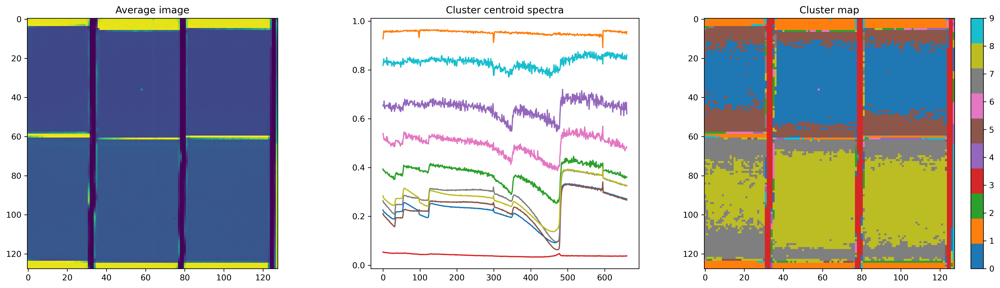

In [12]:
fig,axes = plt.subplots(1,3,figsize=(18,5)); axes=axes.ravel()
axes[0].imshow(wtof,cmap='viridis'); axes[0].set_title('Average image')
p=axes[1].plot(kc);                  axes[1].set_title('Cluster centroid spectra'); axes[1].set_aspect(tof.shape[2], adjustable='box')
cmap=ps.buildCMap(p) # Create a color map with the same colors as the plot

im=axes[2].imshow(c,cmap=cmap); plt.colorbar(im);
axes[2].set_title('Cluster map');
plt.tight_layout()

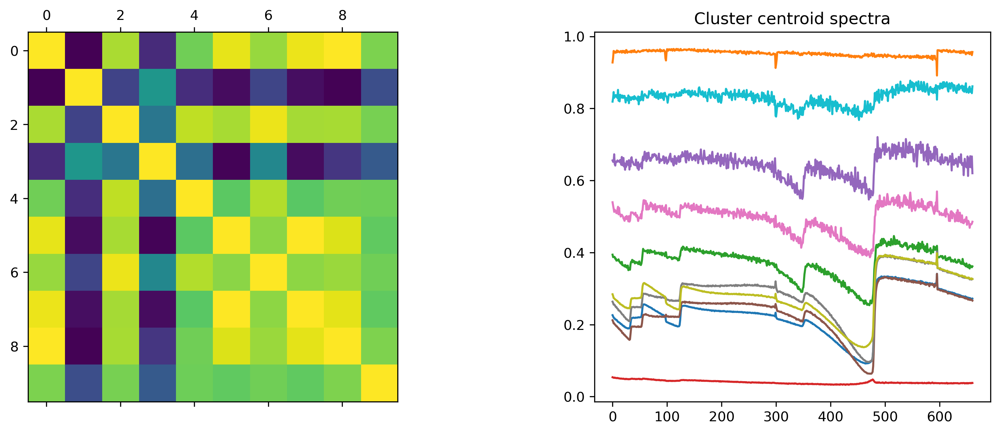

In [13]:
fig,axes = plt.subplots(1,2,figsize=(14,5)); axes=axes.ravel()
axes[0].matshow(np.corrcoef(kc.transpose()))
axes[1].plot(kc); axes[1].set_title('Cluster centroid spectra'); axes[1].set_aspect(tof.shape[2], adjustable='box')

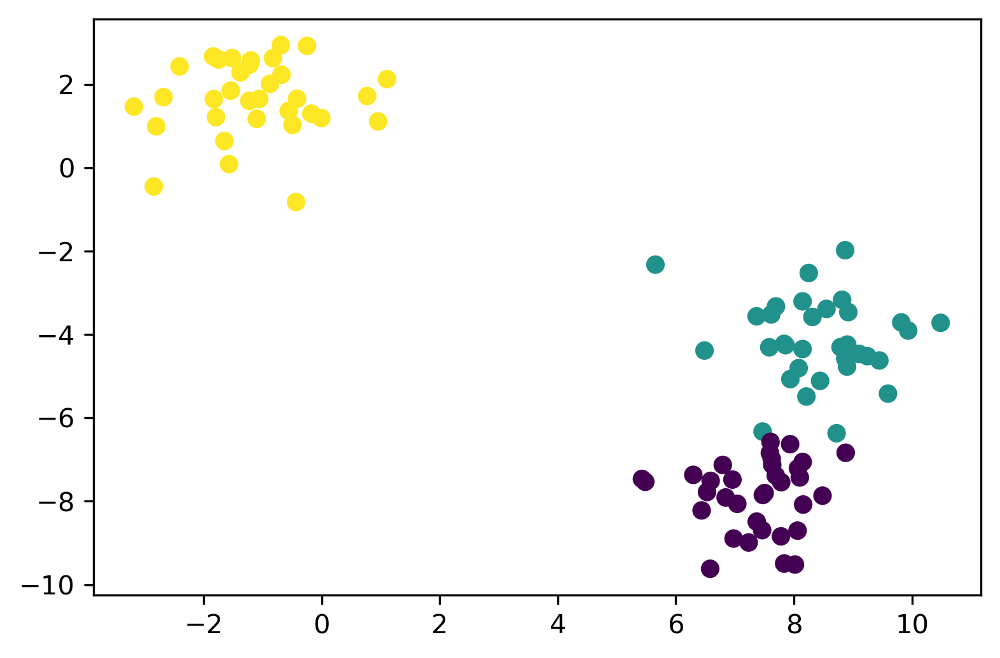

In [14]:
blob_data, blob_labels = make_blobs(n_samples=100, random_state=2018)
test_pts = pd.DataFrame(blob_data, columns=['x', 'y'])
test_pts['group_id'] = blob_labels
plt.scatter(test_pts.x, test_pts.y, c=test_pts.group_id, cmap='viridis');

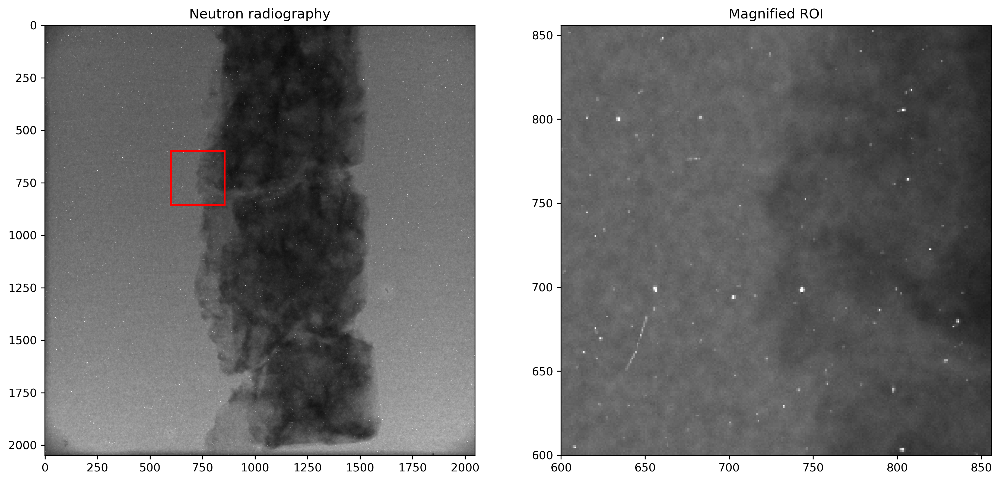

In [15]:
orig= fits.getdata('../data/spots/mixture12_00001.fits')
annotated=io.imread('../data/spots/mixture12_00001.png'); mask=(annotated[:,:,1]==0)
r=600; c=600; w=256
ps.magnifyRegion(orig,[r,c,r+w,c+w],[15,7],vmin=400,vmax=4000,title='Neutron radiography')

In [16]:
def spotCleaner(img, threshold=0.95, selem=np.ones([3,3])) :
    fimg=img.astype('float32')
    mimg = flt.median(fimg,selem=selem)
    timg = threshold < np.abs(fimg-mimg)
    cleaned = mimg * timg + fimg * (1-timg)
    return (cleaned,timg)

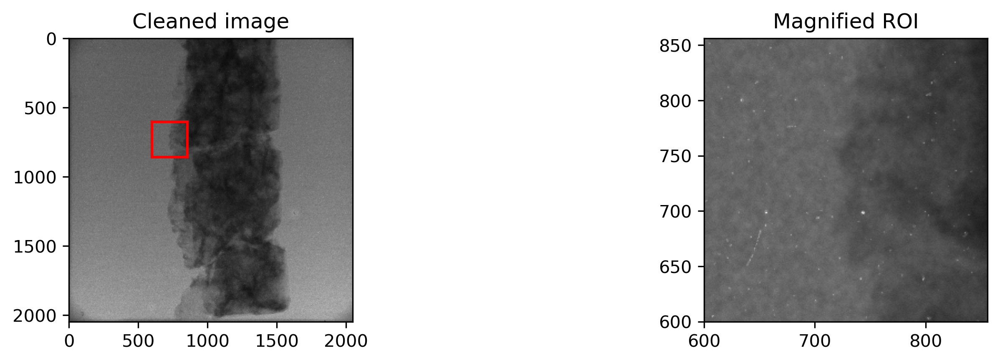

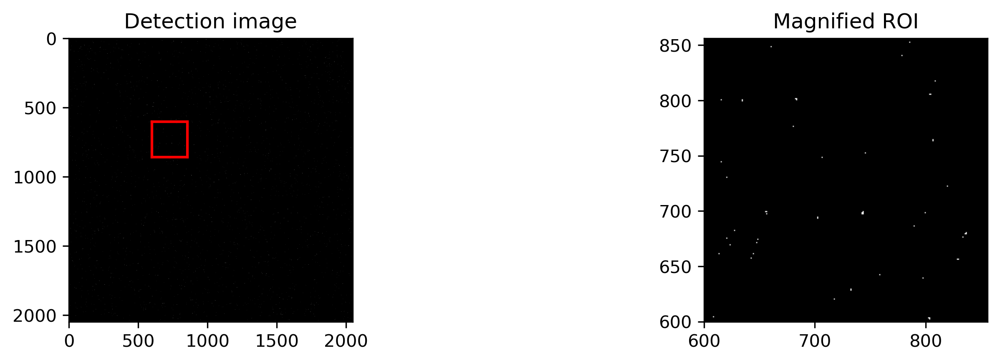

In [17]:
baseclean,timg = spotCleaner(orig,threshold=1000)
ps.magnifyRegion(baseclean,[r,c,r+w,c+w],[12,3],vmin=400,vmax=4000,title='Cleaned image')
ps.magnifyRegion(timg,[r,c,r+w,c+w],[12,3],vmin=0,vmax=1,title='Detection image')

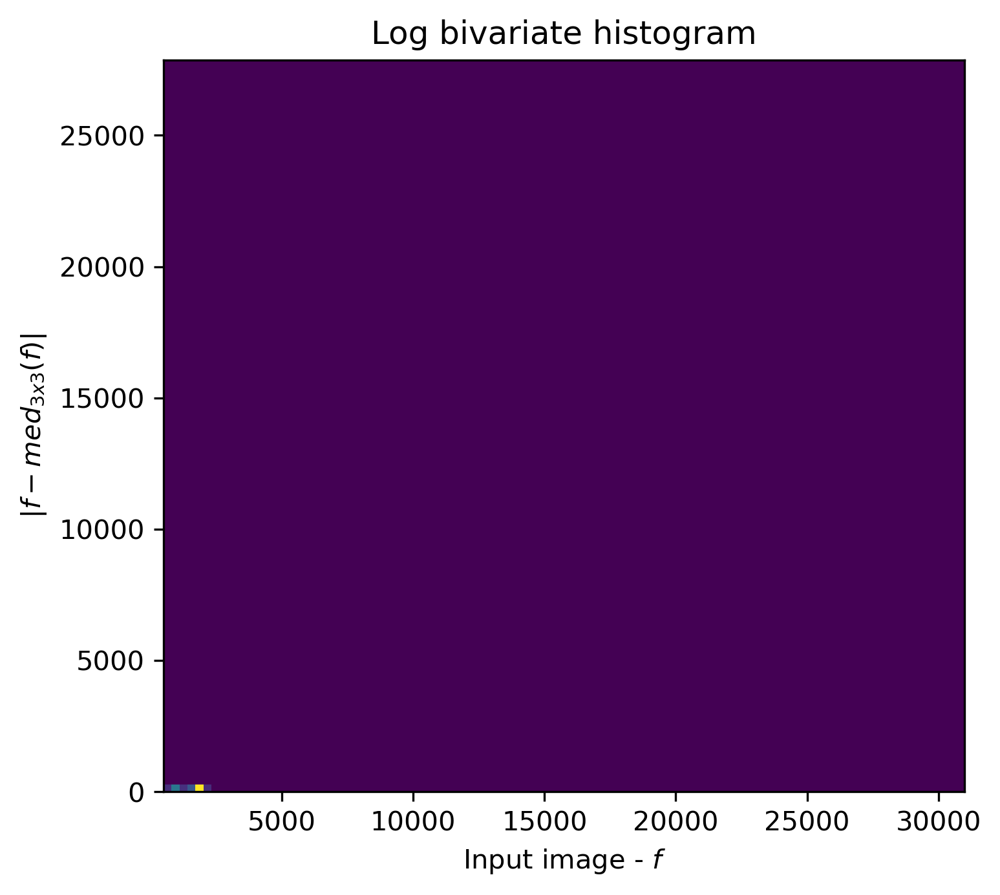

In [18]:
selem=np.ones([3,3])
forig=orig.astype('float32')
mimg = flt.median(forig,selem=selem)
d = np.abs(forig-mimg)

fig,ax=plt.subplots(1,1,figsize=(8,5))
h,x,y,u=ax.hist2d(forig[:1024,:].ravel(),d[:1024,:].ravel(), bins=100);
ax.imshow(np.log(h[::-1]+1),vmin=0,vmax=3,extent=[x.min(),x.max(),y.min(),y.max()])
ax.set_xlabel('Input image - $f$'),ax.set_ylabel('$|f-med_{3x3}(f)|$'),ax.set_title('Log bivariate histogram');

In [19]:
trainorig = forig[:,:1000].ravel()
traind    = d[:,:1000].ravel()
trainmask = mask[:,:1000].ravel()

train_pts = pd.DataFrame({'orig': trainorig, 'd': traind, 'mask':trainmask})

In [20]:
testorig = forig[:,1000:].ravel()
testd    = d[:,1000:].ravel()
testmask = mask[:,1000:].ravel()

test_pts = pd.DataFrame({'orig': testorig, 'd': testd, 'mask':testmask})

In [21]:
k_class = KNeighborsClassifier(1)
k_class.fit(train_pts[['orig', 'd']], train_pts['mask']) 

KNeighborsClassifier(n_neighbors=1)

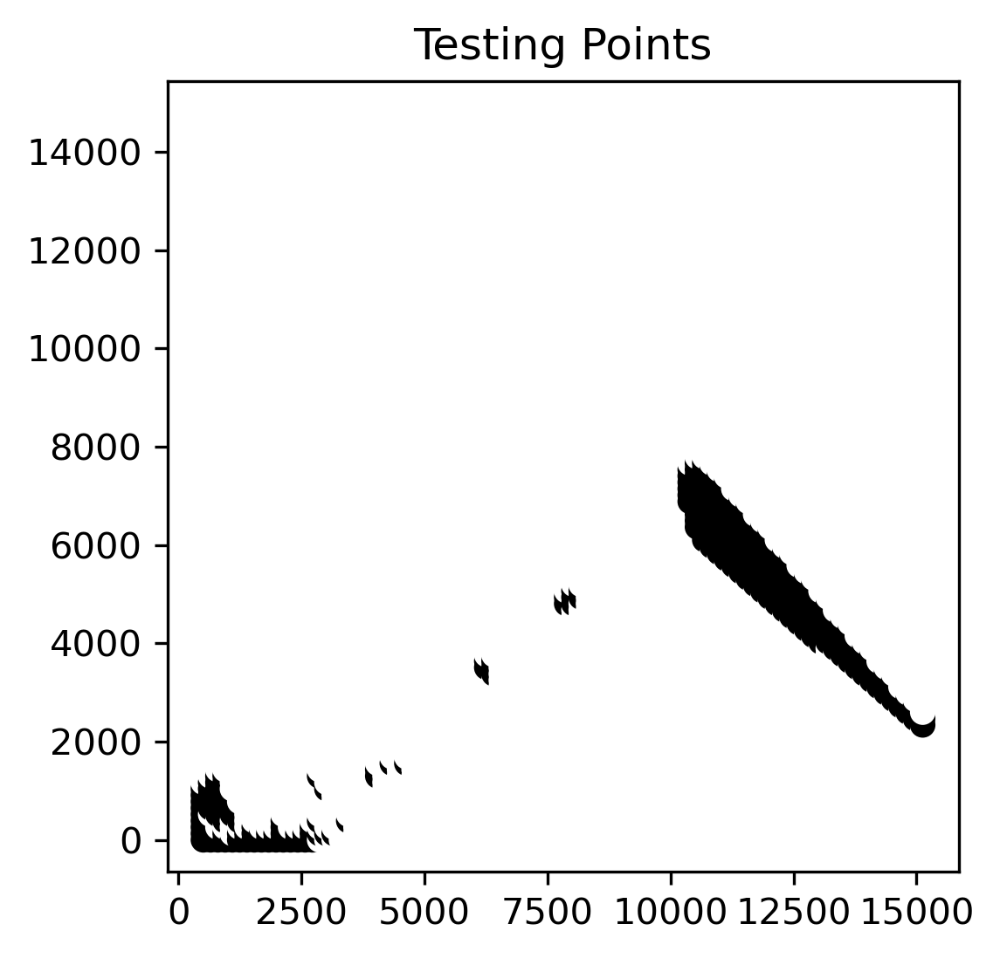

In [22]:
xx, yy = np.meshgrid(np.linspace(test_pts.orig.min(), test_pts.orig.max(), 100),
                     np.linspace(test_pts.d.min(), test_pts.d.max(), 100),indexing='ij');
grid_pts = pd.DataFrame(dict(x=xx.ravel(), y=yy.ravel()))
grid_pts['predicted_id'] = k_class.predict(grid_pts[['x', 'y']])
plt.scatter(grid_pts.x, grid_pts.y, c=grid_pts.predicted_id, cmap='gray'); plt.title('Testing Points'); plt.axis('square');

In [23]:
pred = k_class.predict(test_pts[['orig', 'd']])
pimg = pred.reshape(d[1000:,:].shape)

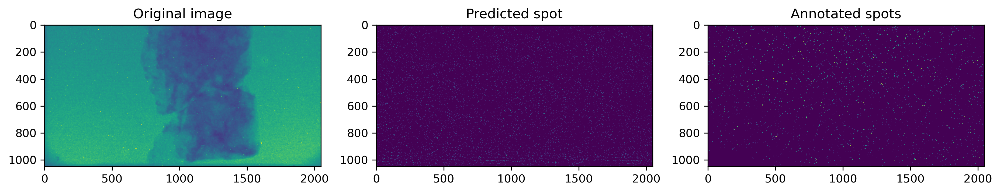

In [24]:
fig,ax = plt.subplots(1,3,figsize=(15,6))
ax[0].imshow(forig[1000:,:],vmin=0,vmax=4000), ax[0].set_title('Original image')
ax[1].imshow(pimg), ax[1].set_title('Predicted spot')
ax[2].imshow(mask[1000:,:]),ax[2].set_title('Annotated spots');

In [25]:
cmbase = confusion_matrix(mask[:,1000:].ravel(), timg[:,1000:].ravel(), normalize='all')
cmknn  = confusion_matrix(mask[:,1000:].ravel(), pimg.ravel(), normalize='all')

(<AxesSubplot:title={'center':'Confusion matrix k-NN'}>,
 Text(0.5, 1.0, 'Confusion matrix k-NN'))

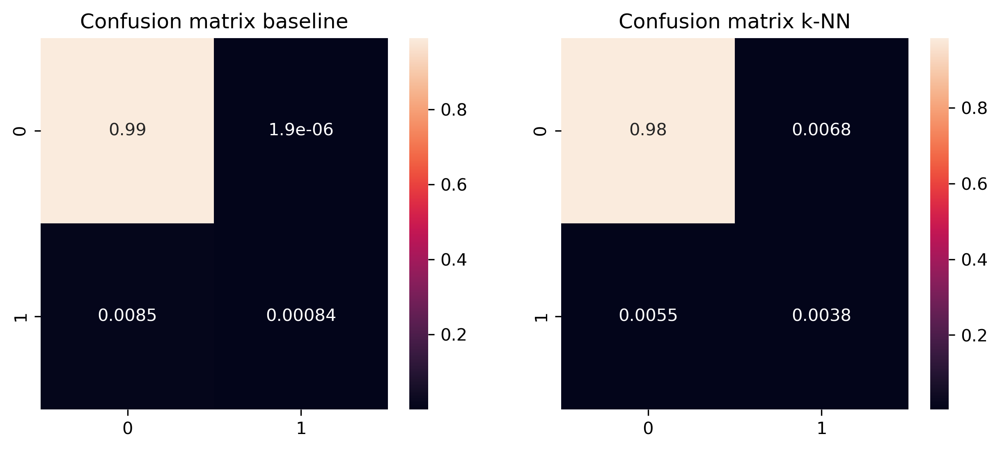

In [26]:
fig,ax = plt.subplots(1,2,figsize=(10,4))
sn.heatmap(cmbase, annot=True,ax=ax[0]), ax[0].set_title('Confusion matrix baseline')
sn.heatmap(cmknn, annot=True,ax=ax[1]), ax[1].set_title('Confusion matrix k-NN')

In [27]:
def splitTiles(img,size=[64,64]) :
    dims = img.shape
    nTiles = [dims[0]//(size[0]), dims[0]//(size[0])]
    
    tiles = []
    
    for x in range(nTiles[0]) :
        for y in range(nTiles[1]) :
            tiles.append(img[x*size[0]:(x+1)*size[0],y*size[1]:(y+1)*size[1]])
            
    return tiles

In [28]:
origTiles = splitTiles(orig);
maskTiles = splitTiles(mask);

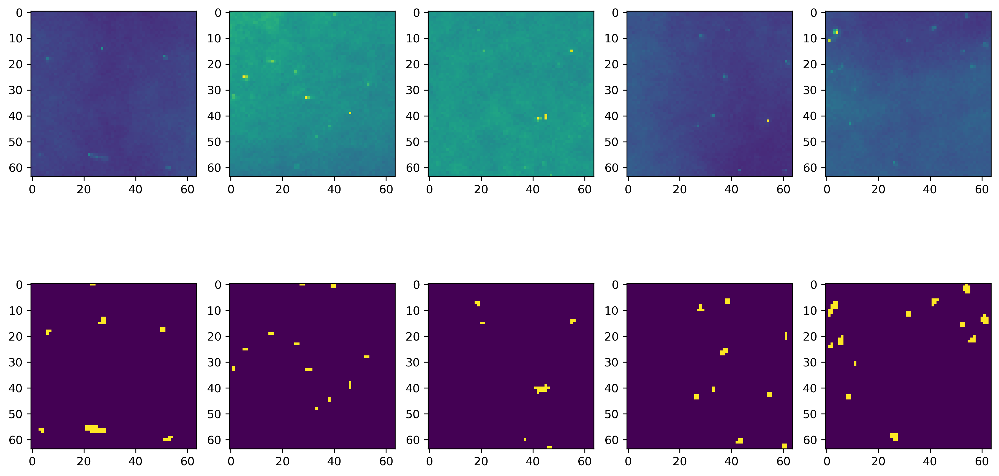

In [29]:
fig,ax = plt.subplots(2,5,figsize=(15,8))
ax=ax.ravel()
for idx,item in enumerate(np.random.randint(len(origTiles), size=5)) :
    ax[idx].imshow(origTiles[item],vmin=200,vmax=4000)
    ax[idx+5].imshow(maskTiles[item])

In [30]:
#### Data provider


In [31]:
#### Model design
